In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Use the kagglehub client library to attach Kaggle resources like competitions, datasets, and models to your session
# Learn more about kagglehub: https://github.com/Kaggle/kagglehub/blob/main/README.md

import kagglehub
# kagglehub.dataset_download('<owner>/<dataset-slug>')

/kaggle/input/datasets/nikitarom/planets-dataset/planet/planet/sample_submission.csv
/kaggle/input/datasets/nikitarom/planets-dataset/planet/planet/train_classes.csv
/kaggle/input/datasets/nikitarom/planets-dataset/planet/planet/test-jpg/test_39140.jpg
/kaggle/input/datasets/nikitarom/planets-dataset/planet/planet/test-jpg/test_4849.jpg
/kaggle/input/datasets/nikitarom/planets-dataset/planet/planet/test-jpg/test_18979.jpg
/kaggle/input/datasets/nikitarom/planets-dataset/planet/planet/test-jpg/test_24790.jpg
/kaggle/input/datasets/nikitarom/planets-dataset/planet/planet/test-jpg/test_30624.jpg
/kaggle/input/datasets/nikitarom/planets-dataset/planet/planet/test-jpg/test_7922.jpg
/kaggle/input/datasets/nikitarom/planets-dataset/planet/planet/test-jpg/test_33905.jpg
/kaggle/input/datasets/nikitarom/planets-dataset/planet/planet/test-jpg/test_15492.jpg
/kaggle/input/datasets/nikitarom/planets-dataset/planet/planet/test-jpg/test_16642.jpg
/kaggle/input/datasets/nikitarom/planets-dataset/plan

In [2]:
# ============================================================
# CELDA 1 — Reconstrucción del estado + setup
# 04_finetuning.ipynb · AmazonNet
# Entorno: Kaggle Notebook (GPU Tesla T4)
# ============================================================

# --- PyTorch ---
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T
import torchvision.models as models
# models contiene todas las arquitecturas preentrenadas de torchvision:
# ResNet, EfficientNet, ViT, etc. La usaremos para cargar EfficientNet-B3

# --- Resto ---
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from PIL import Image
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import fbeta_score
import warnings
warnings.filterwarnings("ignore")

plt.rcParams["figure.dpi"] = 120
plt.rcParams["font.size"]  = 11

# ── Rutas ─────────────────────────────────────────────────────
PLANET_DIR = Path("/kaggle/input/datasets/nikitarom/planets-dataset/planet/planet")
TRAIN_DIR  = PLANET_DIR / "train-jpg"
CSV_TRAIN  = PLANET_DIR / "train_classes.csv"

# ── Dispositivo ───────────────────────────────────────────────
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ── Etiquetas y dataframe ─────────────────────────────────────
df = pd.read_csv(CSV_TRAIN)
df["tag_list"] = df["tags"].str.split()
ALL_LABELS   = sorted(set(tag for tags in df["tag_list"] for tag in tags))
mlb          = MultiLabelBinarizer(classes=ALL_LABELS)
label_matrix = mlb.fit_transform(df["tag_list"])
label_df     = pd.DataFrame(label_matrix, columns=ALL_LABELS)
label_df.insert(0, "image_name", df["image_name"])

# ── AmazonDataset ─────────────────────────────────────────────
class AmazonDataset(Dataset):
    def __init__(self, dataframe, img_dir, labels, transform=None):
        self.dataframe = dataframe.reset_index(drop=True)
        self.img_dir   = Path(img_dir)
        self.labels    = labels
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_name     = self.dataframe.loc[idx, "image_name"]
        img_path     = self.img_dir / f"{img_name}.jpg"
        image        = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        label_vector = self.dataframe.loc[idx, self.labels].values.astype(np.float32)
        labels       = torch.tensor(label_vector, dtype=torch.float32)
        return image, labels

# ── Transforms ────────────────────────────────────────────────
# CAMBIO RESPECTO AL NOTEBOOK 03: IMG_SIZE = 300
# EfficientNet-B3 fue diseñado y preentrenado con imágenes de 300×300.
# Usar el tamaño correcto no es obligatorio (acepta cualquier tamaño),
# pero usar el tamaño de preentrenamiento maximiza la transferencia
# de los features aprendidos en ImageNet.
# En el notebook 03 usábamos 224 para la CNN propia — ahora subimos.
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]
IMG_SIZE = 300   # ← diferencia clave respecto al notebook 03

train_transforms = T.Compose([
    T.Resize((IMG_SIZE, IMG_SIZE), interpolation=T.InterpolationMode.BILINEAR),
    T.RandomHorizontalFlip(p=0.5),
    T.RandomVerticalFlip(p=0.5),
    T.RandomApply([T.RandomRotation(degrees=(90, 90))], p=0.5),
    T.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1),
    T.ToTensor(),
    T.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

val_transforms = T.Compose([
    T.Resize((IMG_SIZE, IMG_SIZE), interpolation=T.InterpolationMode.BILINEAR),
    T.ToTensor(),
    T.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

# ── Split y DataLoaders ───────────────────────────────────────
n_labels_per_image = label_df[ALL_LABELS].sum(axis=1).clip(upper=6)
train_df, val_df = train_test_split(
    label_df, test_size=0.2, random_state=42, stratify=n_labels_per_image
)
train_df = train_df.reset_index(drop=True)
val_df   = val_df.reset_index(drop=True)

# CAMBIO: batch size 32 en vez de 64
# Las imágenes de 300×300 ocupan más VRAM que las de 224×224.
# 300×300×3 = 270.000 valores por imagen vs 224×224×3 = 150.528.
# EfficientNet-B3 también tiene más parámetros que nuestra CNN.
# Con batch 32 tenemos margen suficiente para no tener OOM.
BATCH_SIZE  = 32
NUM_WORKERS = 2

train_dataset = AmazonDataset(train_df, TRAIN_DIR, ALL_LABELS, transform=train_transforms)
val_dataset   = AmazonDataset(val_df,   TRAIN_DIR, ALL_LABELS, transform=val_transforms)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,
                           num_workers=NUM_WORKERS, pin_memory=True, drop_last=True)
val_loader   = DataLoader(val_dataset, batch_size=BATCH_SIZE*2, shuffle=False,
                           num_workers=NUM_WORKERS, pin_memory=True, drop_last=False)

# ── Métricas (mismas funciones que el notebook 03) ────────────
def compute_f2(y_true, y_pred_binary):
    f2_micro = fbeta_score(y_true, y_pred_binary, beta=2,
                            average="micro", zero_division=0)
    f2_macro = fbeta_score(y_true, y_pred_binary, beta=2,
                            average="macro", zero_division=0)
    return {"f2_micro": f2_micro, "f2_macro": f2_macro}

def compute_f2_per_label(y_true, y_pred_binary, labels):
    f2_per_label = fbeta_score(y_true, y_pred_binary, beta=2,
                                average=None, zero_division=0)
    return dict(zip(labels, f2_per_label))

# ── Verificación ──────────────────────────────────────────────
print("=== Estado reconstruido ===")
print(f"  Dispositivo : {DEVICE}")
print(f"  IMG_SIZE    : {IMG_SIZE}×{IMG_SIZE}  (300 para EfficientNet-B3)")
print(f"  Batch size  : {BATCH_SIZE}")
print(f"  Train       : {len(train_df):,} imágenes · {len(train_loader)} batches")
print(f"  Val         : {len(val_df):,} imágenes · {len(val_loader)} batches")
print(f"  Etiquetas   : {len(ALL_LABELS)}")
print(f"\n✅ Listo para cargar EfficientNet-B3")

=== Estado reconstruido ===
  Dispositivo : cuda
  IMG_SIZE    : 300×300  (300 para EfficientNet-B3)
  Batch size  : 32
  Train       : 32,383 imágenes · 1011 batches
  Val         : 8,096 imágenes · 127 batches
  Etiquetas   : 17

✅ Listo para cargar EfficientNet-B3


In [3]:
# ============================================================
# CELDA 2 — EfficientNet-B3 adaptado para multi-etiqueta
# 04_finetuning.ipynb · AmazonNet
# ============================================================

# ── Cargar EfficientNet-B3 con pesos preentrenados ────────────
# weights=IMAGENET1K_V1 carga los pesos del modelo entrenado
# en ImageNet con 1000 clases. Es la transferencia real:
# traemos 12M de parámetros ya entrenados, no pesos aleatorios.
#
# La primera vez que ejecutes esto, torchvision descarga los
# pesos desde internet (~47MB). Kaggle tiene acceso a internet
# en los notebooks, así que no hay problema.

efficientnet = models.efficientnet_b3(
    weights=models.EfficientNet_B3_Weights.IMAGENET1K_V1
)

# ── Inspeccionar la arquitectura original ─────────────────────
# EfficientNet-B3 tiene tres componentes principales:
#   - features  : el backbone (todas las capas convolucionales)
#   - avgpool   : global average pooling (como en nuestra CNN)
#   - classifier: la cabeza original para 1000 clases ImageNet
#
# Necesitamos ver qué hay en classifier para saber exactamente
# qué dimensión de entrada tiene la capa lineal final.
# Eso nos dice cuántos features produce el backbone.

print("=== Arquitectura original EfficientNet-B3 ===")
print(f"\n  Capa 'classifier' original:")
print(f"  {efficientnet.classifier}")
print(f"\n  → El backbone produce un vector de features de tamaño:")

# Extraemos la dimensión de entrada de la capa lineal original
n_features = efficientnet.classifier[1].in_features
print(f"    {n_features} valores por imagen")

# ── Reemplazar la cabeza clasificadora ────────────────────────
# La cabeza original tiene 1000 salidas (una por clase ImageNet).
# Nosotros necesitamos 17 salidas (una por etiqueta del Amazonas).
#
# Estrategia: sustituimos SOLO el último Linear por uno nuestro.
# El Dropout antes del Linear lo conservamos — ayuda a regularizar
# la cabeza nueva durante el entrenamiento.
#
# CRÍTICO: sin sigmoid al final, igual que en el notebook 03.
# BCEWithLogitsLoss lo aplica internamente de forma más estable.

efficientnet.classifier = nn.Sequential(
    nn.Dropout(p=0.3, inplace=True),
    nn.Linear(in_features=n_features, out_features=len(ALL_LABELS))
    # in_features=1536 para EfficientNet-B3
    # out_features=17  → una salida por etiqueta del Amazonas
)

print(f"\n  Capa 'classifier' nueva (adaptada):")
print(f"  {efficientnet.classifier}")

# ── Fase 1: congelar el backbone ──────────────────────────────
# Ponemos requires_grad=False en TODOS los parámetros del backbone
# (efficientnet.features). Solo la cabeza nueva (efficientnet.classifier)
# tendrá requires_grad=True y aprenderá durante la Fase 1.
#
# ¿Por qué congelar primero?
# Si descongeláramos todo desde el principio con un LR de 1e-3,
# los gradientes de la cabeza nueva (muy ruidosos al inicio)
# destruirían los pesos preentrenados del backbone, que costaron
# millones de imágenes de entrenamiento aprender.
# Congelar primero → la cabeza aprende a usar los features del
# backbone sin romperlos. Luego descongelamos con LR muy pequeño.

for param in efficientnet.features.parameters():
    param.requires_grad = False

# Mover a GPU
model_eff = efficientnet.to(DEVICE)

# ── Conteo de parámetros ──────────────────────────────────────
total_params     = sum(p.numel() for p in model_eff.parameters())
trainable_params = sum(p.numel() for p in model_eff.parameters()
                       if p.requires_grad)
frozen_params    = total_params - trainable_params

print(f"\n=== Parámetros del modelo ===")
print(f"  Total       : {total_params:>12,}")
print(f"  Entrenables : {trainable_params:>12,}  ← solo la cabeza")
print(f"  Congelados  : {frozen_params:>12,}  ← backbone ImageNet")
print(f"\n  Ratio entrenabes/total : {trainable_params/total_params*100:.2f}%")

# ── pos_weight (idéntico al notebook 03) ─────────────────────
n_samples  = len(train_df)
pos_counts = train_df[ALL_LABELS].sum().values
neg_counts = n_samples - pos_counts
pos_weight = neg_counts / (pos_counts + 1e-6)
pos_weight_tensor = torch.tensor(pos_weight, dtype=torch.float32).to(DEVICE)

criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight_tensor)

# ── Smoke test ────────────────────────────────────────────────
model_eff.eval()
with torch.no_grad():
    images_batch, labels_batch = next(iter(train_loader))
    images_batch = images_batch.to(DEVICE)
    output = model_eff(images_batch)

print(f"\n=== Smoke test (forward pass) ===")
print(f"  Input  shape : {images_batch.shape}")
print(f"  Output shape : {output.shape}")
print(f"  Output range : [{output.min():.3f}, {output.max():.3f}]")
print(f"\n✅ EfficientNet-B3 adaptado y listo para Fase 1")

Downloading: "https://download.pytorch.org/models/efficientnet_b3_rwightman-b3899882.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b3_rwightman-b3899882.pth


100%|██████████| 47.2M/47.2M [00:00<00:00, 164MB/s]


=== Arquitectura original EfficientNet-B3 ===

  Capa 'classifier' original:
  Sequential(
  (0): Dropout(p=0.3, inplace=True)
  (1): Linear(in_features=1536, out_features=1000, bias=True)
)

  → El backbone produce un vector de features de tamaño:
    1536 valores por imagen

  Capa 'classifier' nueva (adaptada):
  Sequential(
  (0): Dropout(p=0.3, inplace=True)
  (1): Linear(in_features=1536, out_features=17, bias=True)
)

=== Parámetros del modelo ===
  Total       :   10,722,361
  Entrenables :       26,129  ← solo la cabeza
  Congelados  :   10,696,232  ← backbone ImageNet

  Ratio entrenabes/total : 0.24%

=== Smoke test (forward pass) ===
  Input  shape : torch.Size([32, 3, 300, 300])
  Output shape : torch.Size([32, 17])
  Output range : [-0.395, 0.550]

✅ EfficientNet-B3 adaptado y listo para Fase 1


In [4]:
# ============================================================
# CELDA 3 — Fase 1: Feature Extraction (backbone congelado)
# 04_finetuning.ipynb · AmazonNet
# ============================================================

# ── ¿Qué hacemos en esta fase? ────────────────────────────────
# Entrenamos SOLO la cabeza nueva (26.129 parámetros).
# El backbone permanece congelado — sus pesos no cambian.
# 
# Objetivo: que la cabeza aprenda a mapear los 1536 features
# del backbone al espacio de 17 etiquetas del Amazonas.
# Cuántas épocas: pocas (5-7). La cabeza es pequeña y aprende
# rápido. Más épocas no añaden valor porque el backbone
# congelado siempre produce los mismos features.
#
# LR: podemos usar un LR relativamente alto (1e-3) porque
# solo la cabeza aprende — no hay riesgo de destruir
# los pesos preentrenados del backbone.

# ── Optimizer: solo parámetros entrenables ────────────────────
# CRÍTICO: pasamos solo los parámetros con requires_grad=True.
# Si pasáramos model_eff.parameters() completo, Adam intentaría
# actualizar también los parámetros congelados — no causaría
# error pero sería ineficiente (calcularía momentos de Adam
# para parámetros que nunca se actualizan).
optimizer_phase1 = optim.Adam(
    filter(lambda p: p.requires_grad, model_eff.parameters()),
    lr=1e-3
)

# ── Loop de entrenamiento (reutilizamos las funciones del 03) ──
def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()
    total_loss = 0.0
    for images, labels in loader:
        images  = images.to(device)
        labels  = labels.to(device)
        outputs = model(images)
        loss    = criterion(outputs, labels)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(loader)

def validate(model, loader, criterion, device, threshold=0.3):
    model.eval()
    total_loss = 0.0
    all_preds  = []
    all_labels = []
    with torch.no_grad():
        for images, labels in loader:
            images  = images.to(device)
            labels  = labels.to(device)
            outputs = model(images)
            loss    = criterion(outputs, labels)
            total_loss += loss.item()
            probs  = torch.sigmoid(outputs)
            preds  = (probs >= threshold).float()
            all_preds.append(preds.cpu().numpy())
            all_labels.append(labels.cpu().numpy())
    all_preds  = np.concatenate(all_preds,  axis=0)
    all_labels = np.concatenate(all_labels, axis=0)
    f2_scores  = compute_f2(all_labels, all_preds)
    return total_loss / len(loader), f2_scores, all_preds, all_labels

# ── Fase 1: entrenamiento ─────────────────────────────────────
N_EPOCHS_PHASE1 = 7
THRESHOLD       = 0.3

history_p1 = {"train_loss": [], "val_loss": [],
               "f2_micro": [],  "f2_macro": []}

best_f2_p1    = 0.0
best_epoch_p1 = 0

print("=" * 65)
print("  FASE 1 — Feature Extraction (backbone congelado)")
print(f"  Parámetros entrenables: {sum(p.numel() for p in model_eff.parameters() if p.requires_grad):,}")
print("=" * 65)
print(f"  {'Época':<7} {'Train Loss':>11} {'Val Loss':>10} "
      f"{'F2 Micro':>10} {'F2 Macro':>10}")
print("-" * 55)

for epoch in range(1, N_EPOCHS_PHASE1 + 1):

    train_loss = train_one_epoch(model_eff, train_loader, criterion,
                                  optimizer_phase1, DEVICE)
    val_loss, f2_scores, _, _ = validate(model_eff, val_loader,
                                          criterion, DEVICE, THRESHOLD)
    f2_micro = f2_scores["f2_micro"]
    f2_macro = f2_scores["f2_macro"]

    history_p1["train_loss"].append(train_loss)
    history_p1["val_loss"].append(val_loss)
    history_p1["f2_micro"].append(f2_micro)
    history_p1["f2_macro"].append(f2_macro)

    if f2_macro > best_f2_p1:
        best_f2_p1    = f2_macro
        best_epoch_p1 = epoch
        torch.save(model_eff.state_dict(), "best_efficientnet_phase1.pth")
        flag = " ← mejor"
    else:
        flag = ""

    print(f"  {epoch:<7} {train_loss:>11.4f} {val_loss:>10.4f} "
          f"{f2_micro:>10.4f} {f2_macro:>10.4f}{flag}")

print("-" * 55)
print(f"\n  Mejor F2-macro Fase 1 : {best_f2_p1:.4f}  (época {best_epoch_p1})")
print(f"  Baseline CNN          : 0.4616")
print(f"  Mejora hasta ahora    : {best_f2_p1 - 0.4616:+.4f}")
print(f"\n✅ Fase 1 completada — listo para Fine-tuning")

  FASE 1 — Feature Extraction (backbone congelado)
  Parámetros entrenables: 26,129
  Época    Train Loss   Val Loss   F2 Micro   F2 Macro
-------------------------------------------------------
  1            0.7736     4.7483     0.6799     0.4605 ← mejor
  2            0.6486     2.4636     0.6948     0.4666 ← mejor
  3            0.6315     4.7910     0.7119     0.4781 ← mejor
  4            0.6104    19.0402     0.7194     0.4786 ← mejor
  5            0.6079     0.8273     0.7392     0.4914 ← mejor
  6            0.5987     0.7422     0.7425     0.4921 ← mejor
  7            0.5974    56.7930     0.7450     0.4937 ← mejor
-------------------------------------------------------

  Mejor F2-macro Fase 1 : 0.4937  (época 7)
  Baseline CNN          : 0.4616
  Mejora hasta ahora    : +0.0321

✅ Fase 1 completada — listo para Fine-tuning


In [5]:
# ============================================================
# CELDA 4 — Fase 2: Fine-tuning (descongelar capas profundas)
# 04_finetuning.ipynb · AmazonNet
# ============================================================

# ── Cargar el mejor modelo de la Fase 1 ──────────────────────
model_eff.load_state_dict(
    torch.load("best_efficientnet_phase1.pth", map_location=DEVICE)
)

# ── Estrategia de descongelado ────────────────────────────────
# EfficientNet-B3 tiene 9 bloques en features (indices 0-8).
# NO descongelamos todo el backbone — solo las capas más profundas.
#
# ¿Por qué no descongelar todo?
# Las primeras capas (índices 0-4) detectan features genéricos:
# bordes, esquinas, gradientes de color. Estos son universales
# y ya son perfectos para cualquier dominio visual — no hay
# nada que mejorar ahí con imágenes de satélite.
#
# Las capas profundas (índices 5-8) detectan features de alto
# nivel: texturas complejas, formas, patrones. ESTAS son las
# que necesitan adaptarse al dominio satelital — la textura
# de selva primaria, los patrones geométricos de agricultura,
# la irregularidad de una mina artesanal.
#
# Descongelamos solo features[5:] + classifier (la cabeza).

# Primero, aseguramos que todo está congelado
for param in model_eff.parameters():
    param.requires_grad = False

# Descongelamos las últimas 4 capas del backbone + la cabeza
for block_idx in [5, 6, 7, 8]:
    for param in model_eff.features[block_idx].parameters():
        param.requires_grad = True

# La cabeza siempre descongelada
for param in model_eff.classifier.parameters():
    param.requires_grad = True

# ── Verificación del descongelado ────────────────────────────
total_params     = sum(p.numel() for p in model_eff.parameters())
trainable_params = sum(p.numel() for p in model_eff.parameters()
                       if p.requires_grad)
frozen_params    = total_params - trainable_params

print("=== Parámetros tras descongelar capas 5-8 ===")
print(f"  Total       : {total_params:>12,}")
print(f"  Entrenables : {trainable_params:>12,}")
print(f"  Congelados  : {frozen_params:>12,}")
print(f"  Ratio       : {trainable_params/total_params*100:.1f}%")

# ── Optimizer con learning rates diferenciados ────────────────
# CONCEPTO CLAVE: usamos LRs distintos para la cabeza y el backbone.
#
# La cabeza nueva (26k params): LR = 1e-4
#   Ya aprendió en la Fase 1 con LR=1e-3.
#   Ahora la ajustamos más fino.
#
# El backbone descongelado (features 5-8): LR = 1e-5
#   10x más pequeño que la cabeza.
#   Razón: los pesos preentrenados ya son buenos.
#   Queremos ADAPTAR suavemente, no REESCRIBIR.
#   Un LR grande destruiría lo aprendido en ImageNet.
#   Esta técnica se llama "discriminative learning rates"
#   y es estándar en transfer learning.

optimizer_phase2 = optim.Adam([
    {
        "params": model_eff.classifier.parameters(),
        "lr"    : 1e-4,          # cabeza: LR moderado
    },
    {
        "params": [p for i in [5, 6, 7, 8]
                   for p in model_eff.features[i].parameters()],
        "lr"    : 1e-5,          # backbone: LR muy pequeño
    }
])

# Scheduler: igual que en el notebook 03
scheduler_phase2 = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_phase2, mode="max", factor=0.5, patience=3
)

# ── Fase 2: entrenamiento ─────────────────────────────────────
N_EPOCHS_PHASE2 = 10

history_p2 = {"train_loss": [], "val_loss": [],
               "f2_micro": [],  "f2_macro": []}

best_f2_p2    = 0.0
best_epoch_p2 = 0

print("\n" + "=" * 65)
print("  FASE 2 — Fine-tuning (capas 5-8 descongeladas)")
print(f"  LR cabeza: 1e-4  |  LR backbone: 1e-5")
print("=" * 65)
print(f"  {'Época':<7} {'Train Loss':>11} {'Val Loss':>10} "
      f"{'F2 Micro':>10} {'F2 Macro':>10}")
print("-" * 55)

for epoch in range(1, N_EPOCHS_PHASE2 + 1):

    train_loss = train_one_epoch(model_eff, train_loader, criterion,
                                  optimizer_phase2, DEVICE)
    val_loss, f2_scores, _, _ = validate(model_eff, val_loader,
                                          criterion, DEVICE, THRESHOLD)
    f2_micro = f2_scores["f2_micro"]
    f2_macro = f2_scores["f2_macro"]

    scheduler_phase2.step(f2_macro)

    history_p2["train_loss"].append(train_loss)
    history_p2["val_loss"].append(val_loss)
    history_p2["f2_micro"].append(f2_micro)
    history_p2["f2_macro"].append(f2_macro)

    if f2_macro > best_f2_p2:
        best_f2_p2    = f2_macro
        best_epoch_p2 = epoch
        torch.save(model_eff.state_dict(), "best_efficientnet_finetuned.pth")
        flag = " ← mejor"
    else:
        flag = ""

    # Mostrar LR actual de ambos grupos
    lr_head    = optimizer_phase2.param_groups[0]["lr"]
    lr_backbone = optimizer_phase2.param_groups[1]["lr"]
    print(f"  {epoch:<7} {train_loss:>11.4f} {val_loss:>10.4f} "
          f"{f2_micro:>10.4f} {f2_macro:>10.4f}{flag}  "
          f"[lr_head={lr_head:.0e} lr_bb={lr_backbone:.0e}]")

print("-" * 55)
print(f"\n  Mejor F2-macro Fase 2 : {best_f2_p2:.4f}  (época {best_epoch_p2})")
print(f"  Mejor F2-macro Fase 1 : {best_f2_p1:.4f}")
print(f"  Baseline CNN          : 0.4616")
print(f"  Mejora total          : {best_f2_p2 - 0.4616:+.4f}")
print(f"\n✅ Fine-tuning completado")

=== Parámetros tras descongelar capas 5-8 ===
  Total       :   10,722,361
  Entrenables :    9,919,967
  Congelados  :      802,394
  Ratio       : 92.5%

  FASE 2 — Fine-tuning (capas 5-8 descongeladas)
  LR cabeza: 1e-4  |  LR backbone: 1e-5
  Época    Train Loss   Val Loss   F2 Micro   F2 Macro
-------------------------------------------------------
  1            0.5681     2.6026     0.7576     0.5006 ← mejor  [lr_head=1e-04 lr_bb=1e-05]
  2            0.5296    18.4992     0.7611     0.5051 ← mejor  [lr_head=1e-04 lr_bb=1e-05]
  3            0.5181     3.9024     0.7703     0.5092 ← mejor  [lr_head=1e-04 lr_bb=1e-05]
  4            0.4996     1.3772     0.7755     0.5147 ← mejor  [lr_head=1e-04 lr_bb=1e-05]
  5            0.4866    14.6446     0.7808     0.5149 ← mejor  [lr_head=1e-04 lr_bb=1e-05]
  6            0.4604     7.9861     0.7900     0.5213 ← mejor  [lr_head=1e-04 lr_bb=1e-05]
  7            0.4531     1.6652     0.7981     0.5308 ← mejor  [lr_head=1e-04 lr_bb=1e-05]


✅ Mejor modelo cargado (época 9, F2-macro = 0.5379)

=== Métricas globales — EfficientNet-B3 finetuned ===
  F2 Micro : 0.8130
  F2 Macro : 0.5435

=== F2-score por etiqueta — comparativa ===
  Etiqueta                Baseline  EfficientNet        Δ    Soporte
  ----------------------------------------------------------------------
  clear                     0.9305        0.9584  +0.0279 ↑      5,710
  primary                   0.9630        0.9455  -0.0175 ↓      7,496
  partly_cloudy             0.6934        0.9113  +0.2179 ↑      1,449
  agriculture               0.8464        0.8820  +0.0356 ↑      2,471
  road                      0.7716        0.8409  +0.0693 ↑      1,614
  water                     0.6348        0.7891  +0.1543 ↑      1,526
  cloudy                    0.6994        0.7798  +0.0804 ↑        418
  haze                      0.4781        0.6523  +0.1742 ↑        519
  cultivation               0.5581        0.6422  +0.0841 ↑        896
  habitation               

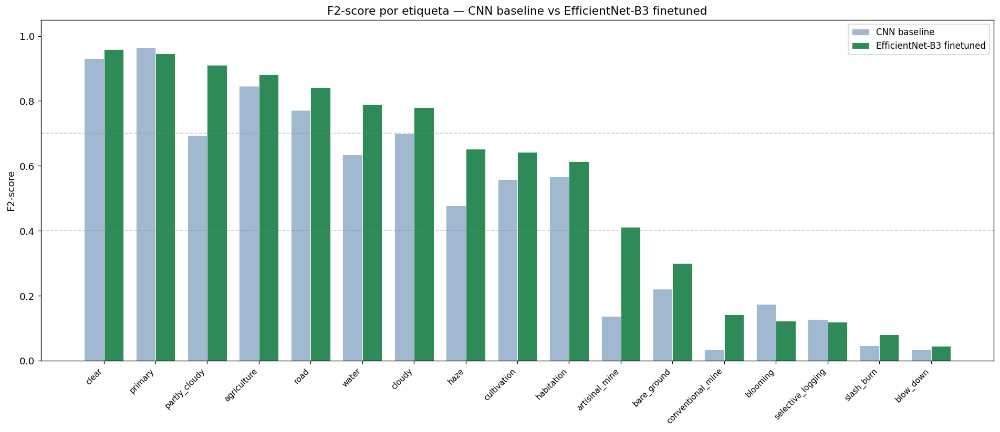

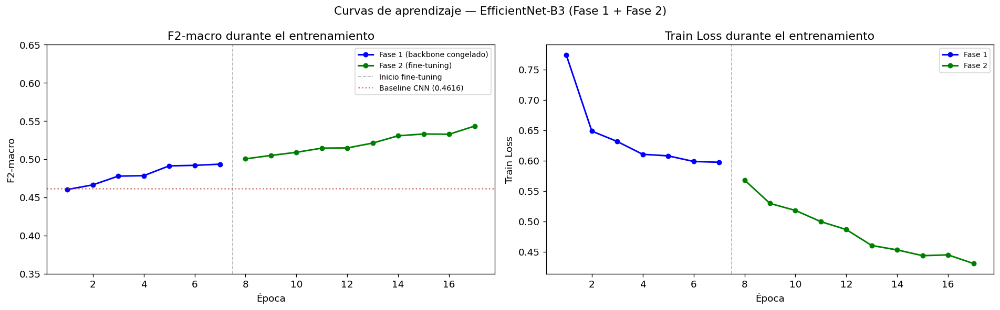


  COMPARATIVA FINAL DEL PROYECTO
  Modelo                           F2-macro   F2-micro
-------------------------------------------------------
  CNN desde cero (baseline)          0.4616     0.7213
  EfficientNet-B3 Fase 1             0.4937
  EfficientNet-B3 Fine-tuned         0.5435     0.8130
-------------------------------------------------------
  Mejora total (macro)  :    +0.0819
  Mejora total (micro)  :    +0.0917

  Clases mejoradas respecto al baseline:
    artisinal_mine         0.137 → 0.412  (+0.275)
    partly_cloudy          0.693 → 0.911  (+0.218)
    haze                   0.478 → 0.652  (+0.174)
    water                  0.635 → 0.789  (+0.154)
    conventional_mine      0.034 → 0.143  (+0.109)
    cultivation            0.558 → 0.642  (+0.084)
    cloudy                 0.699 → 0.780  (+0.080)
    bare_ground            0.221 → 0.301  (+0.080)
    road                   0.772 → 0.841  (+0.069)
    habitation             0.567 → 0.614  (+0.048)
    agriculture    

In [6]:
# ============================================================
# CELDA 5 — Evaluación final y comparativa con baseline
# 04_finetuning.ipynb · AmazonNet
# ============================================================

# ── Cargar el mejor modelo del fine-tuning ────────────────────
model_eff.load_state_dict(
    torch.load("best_efficientnet_finetuned.pth", map_location=DEVICE)
)
model_eff.eval()
print("✅ Mejor modelo cargado (época 9, F2-macro = 0.5379)")

# ── Evaluación completa ───────────────────────────────────────
val_loss, f2_scores, all_preds, all_labels = validate(
    model_eff, val_loader, criterion, DEVICE, THRESHOLD
)

print(f"\n=== Métricas globales — EfficientNet-B3 finetuned ===")
print(f"  F2 Micro : {f2_scores['f2_micro']:.4f}")
print(f"  F2 Macro : {f2_scores['f2_macro']:.4f}")

# ── F2 por etiqueta — comparativa con baseline ────────────────
# Resultados del notebook 03 (CNN baseline) — hardcodeados
# para poder comparar directamente sin relanzar el notebook
baseline_f2 = {
    "primary"          : 0.9630, "clear"             : 0.9305,
    "agriculture"      : 0.8464, "road"              : 0.7716,
    "cloudy"           : 0.6994, "partly_cloudy"     : 0.6934,
    "water"            : 0.6348, "habitation"        : 0.5665,
    "cultivation"      : 0.5581, "haze"              : 0.4781,
    "bare_ground"      : 0.2208, "blooming"          : 0.1750,
    "artisinal_mine"   : 0.1370, "selective_logging" : 0.1279,
    "slash_burn"       : 0.0461, "blow_down"         : 0.0341,
    "conventional_mine": 0.0335,
}

f2_by_label = compute_f2_per_label(all_labels, all_preds, ALL_LABELS)
support      = all_labels.sum(axis=0)
support_dict = dict(zip(ALL_LABELS, support))

print(f"\n=== F2-score por etiqueta — comparativa ===")
print(f"  {'Etiqueta':<22} {'Baseline':>9} {'EfficientNet':>13} "
      f"{'Δ':>8}   {'Soporte':>8}")
print("  " + "-" * 70)

# Ordenar por F2 del EfficientNet descendente
f2_sorted = sorted(f2_by_label.items(), key=lambda x: -x[1])

for label, f2_eff in f2_sorted:
    f2_base = baseline_f2[label]
    delta   = f2_eff - f2_base
    sup     = int(support_dict[label])
    arrow   = "↑" if delta > 0.01 else ("↓" if delta < -0.01 else "→")
    print(f"  {label:<22} {f2_base:>9.4f} {f2_eff:>13.4f} "
          f"{delta:>+8.4f} {arrow}   {sup:>8,}")

# ── Visualización 1: comparativa de barras por etiqueta ───────
fig, ax = plt.subplots(figsize=(16, 7))

labels_ordered = [x[0] for x in f2_sorted]
f2_base_vals   = [baseline_f2[l] for l in labels_ordered]
f2_eff_vals    = [f2_by_label[l] for l in labels_ordered]

x      = np.arange(len(labels_ordered))
width  = 0.38

bars1 = ax.bar(x - width/2, f2_base_vals, width,
               label="CNN baseline", color="#A0B8D0",
               edgecolor="white", linewidth=0.5)
bars2 = ax.bar(x + width/2, f2_eff_vals,  width,
               label="EfficientNet-B3 finetuned", color="#2E8B57",
               edgecolor="white", linewidth=0.5)

ax.set_xticks(x)
ax.set_xticklabels(labels_ordered, rotation=45, ha="right", fontsize=9)
ax.set_ylabel("F2-score")
ax.set_title("F2-score por etiqueta — CNN baseline vs EfficientNet-B3 finetuned",
             fontsize=13)
ax.set_ylim(0, 1.05)
ax.axhline(0.7, color="gray", linestyle="--", alpha=0.4, linewidth=1)
ax.axhline(0.4, color="gray", linestyle="--", alpha=0.4, linewidth=1)
ax.legend(fontsize=10)

plt.tight_layout()
plt.savefig("f2_comparison.png", dpi=130, bbox_inches="tight")
plt.show()

# ── Visualización 2: curvas de aprendizaje combinadas ─────────
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
fig.suptitle("Curvas de aprendizaje — EfficientNet-B3 (Fase 1 + Fase 2)",
             fontsize=13)

# F2-macro — la métrica que importa
ax1 = axes[0]
epochs_p1 = range(1, N_EPOCHS_PHASE1 + 1)
epochs_p2 = range(N_EPOCHS_PHASE1 + 1, N_EPOCHS_PHASE1 + N_EPOCHS_PHASE2 + 1)

ax1.plot(epochs_p1, history_p1["f2_macro"], "b-o", markersize=5,
         linewidth=1.8, label="Fase 1 (backbone congelado)")
ax1.plot(epochs_p2, history_p2["f2_macro"], "g-o", markersize=5,
         linewidth=1.8, label="Fase 2 (fine-tuning)")
ax1.axvline(N_EPOCHS_PHASE1 + 0.5, color="gray", linestyle="--",
            alpha=0.6, linewidth=1, label="Inicio fine-tuning")
ax1.axhline(0.4616, color="#C0392B", linestyle=":", alpha=0.7,
            linewidth=1.5, label="Baseline CNN (0.4616)")
ax1.set_xlabel("Época")
ax1.set_ylabel("F2-macro")
ax1.set_title("F2-macro durante el entrenamiento")
ax1.legend(fontsize=8.5)
ax1.set_ylim(0.35, 0.65)

# Train loss
ax2 = axes[1]
ax2.plot(epochs_p1, history_p1["train_loss"], "b-o", markersize=5,
         linewidth=1.8, label="Fase 1")
ax2.plot(epochs_p2, history_p2["train_loss"], "g-o", markersize=5,
         linewidth=1.8, label="Fase 2")
ax2.axvline(N_EPOCHS_PHASE1 + 0.5, color="gray", linestyle="--",
            alpha=0.6, linewidth=1)
ax2.set_xlabel("Época")
ax2.set_ylabel("Train Loss")
ax2.set_title("Train Loss durante el entrenamiento")
ax2.legend(fontsize=8.5)

plt.tight_layout()
plt.savefig("learning_curves_efficientnet.png", dpi=130, bbox_inches="tight")
plt.show()

# ── Tabla resumen final del proyecto ─────────────────────────
print("\n" + "=" * 55)
print("  COMPARATIVA FINAL DEL PROYECTO")
print("=" * 55)
print(f"  {'Modelo':<30} {'F2-macro':>10} {'F2-micro':>10}")
print("-" * 55)
print(f"  {'CNN desde cero (baseline)':<30} {'0.4616':>10} {'0.7213':>10}")
print(f"  {'EfficientNet-B3 Fase 1':<30} {best_f2_p1:>10.4f}")
print(f"  {'EfficientNet-B3 Fine-tuned':<30} {f2_scores['f2_macro']:>10.4f} "
      f"{f2_scores['f2_micro']:>10.4f}")
print("-" * 55)
print(f"  Mejora total (macro)  : {f2_scores['f2_macro'] - 0.4616:>+10.4f}")
print(f"  Mejora total (micro)  : {f2_scores['f2_micro'] - 0.7213:>+10.4f}")
print()
print(f"  Clases mejoradas respecto al baseline:")
mejoradas = [(l, f2_by_label[l], baseline_f2[l])
             for l in ALL_LABELS if f2_by_label[l] > baseline_f2[l] + 0.01]
mejoradas.sort(key=lambda x: -(x[1]-x[2]))
for label, f2_e, f2_b in mejoradas:
    print(f"    {label:<22} {f2_b:.3f} → {f2_e:.3f}  "
          f"({f2_e-f2_b:+.3f})")
print(f"\n✅ Evaluación completa. Notebook 04 terminado.")